In [ ]:
# Install necessary libraries
!wget -nc https://github.com/rapidsai/rapidsai-csp-utils/archive/refs/heads/main.zip
!unzip -o main.zip
!bash rapidsai-csp-utils-main/colab/rapids-colab.sh stable

# Update environment variables
import sys
sys.path.append('/usr/local/lib/python3.11/site-packages')

# Install additional dependencies
!pip install xgboost shap seaborn plotly -q

# Import libraries
import os
import cv2
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
import cupy as cp
import numpy as np
from tqdm import tqdm
import cuml
from cuml.ensemble import RandomForestClassifier
from cuml.svm import SVC
from cuml.neighbors import KNeighborsClassifier
try:
    from cuml import DecisionTreeClassifier
    print("DecisionTreeClassifier imported successfully!")
except ImportError:
    print("DecisionTreeClassifier not available. Using sklearn instead.")
    from sklearn.tree import DecisionTreeClassifier

from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import pickle
from google.colab import drive
import shap

# Mount Google Drive
drive.mount('/content/drive')
print("Setup complete! CuML version:", cuml.__version__)

--2025-04-18 16:28:54--  https://github.com/rapidsai/rapidsai-csp-utils/archive/refs/heads/main.zip
Resolving github.com (github.com)... 140.82.116.3
Connecting to github.com (github.com)|140.82.116.3|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://github.com/rapidsai-community/rapidsai-csp-utils/archive/refs/heads/main.zip [following]
--2025-04-18 16:28:54--  https://github.com/rapidsai-community/rapidsai-csp-utils/archive/refs/heads/main.zip
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://codeload.github.com/rapidsai-community/rapidsai-csp-utils/zip/refs/heads/main [following]
--2025-04-18 16:28:55--  https://codeload.github.com/rapidsai-community/rapidsai-csp-utils/zip/refs/heads/main
Resolving codeload.github.com (codeload.github.com)... 140.82.116.9
Connecting to codeload.github.com (codeload.github.com)|140.82.116.9|:443... connected.
HTTP request sent, awaiting r

# Feature Extraction and Preprocessing Function

In [ ]:
# Feature extraction with preprocessing visualization option
def extract_features(image_path, model, visualize=False):
    # Load raw image
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Error loading image: {image_path}")

    # Raw image (BGR to RGB)
    raw_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Preprocessing steps
    preprocessed_image = cv2.resize(raw_image, (224, 224))  # Resize
    preprocessed_image = tf.keras.preprocessing.image.img_to_array(preprocessed_image).astype("float32") / 255.0  # Normalize
    preprocessed_image_input = np.expand_dims(preprocessed_image, axis=0)  # Add batch dimension

    # Extract features
    features = model.predict(preprocessed_image_input)

    # Visualize if requested
    if visualize:
        return features.flatten(), raw_image, preprocessed_image
    return features.flatten()

print("Feature extraction function defined!")

Feature extraction function defined!


# Load Dataset

# Install Dependencies

In [ ]:
def load_dataset(image_folder, model):
    X, y = [], []
    # Filter out hidden folders like .ipynb_checkpoints
    class_labels = sorted([d for d in os.listdir(image_folder) if os.path.isdir(os.path.join(image_folder, d)) and not d.startswith('.')])
    sample_images = {label: None for label in class_labels}

    for label in tqdm(class_labels, desc="Processing Classes"):
        class_path = os.path.join(image_folder, label)
        if not os.path.isdir(class_path):
            print(f"Skipping {class_path}: Not a directory")
            continue

        image_files = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        if not image_files:
            print(f"No valid images in {class_path}")
            continue

        for image_name in image_files:
            image_path = os.path.join(class_path, image_name)
            try:
                if sample_images[label] is None:
                    features, raw_img, preproc_img = extract_features(image_path, model, visualize=True)
                    sample_images[label] = (raw_img, preproc_img)
                    print(f"Loaded sample image for {label}: {image_path}")
                else:
                    features = extract_features(image_path, model, visualize=False)
                X.append(features)
                y.append(label)
            except Exception as e:
                print(f"Skipping {image_path}: {e}")

    if not X:
        raise ValueError("No images were successfully processed. Check dataset path and image files.")

    X = np.array(X)
    y = np.array(y)
    return X, y, class_labels, sample_images

image_folder = "/content/drive/MyDrive/Fruits Original/Mango"
base_model = EfficientNetB0(weights="imagenet", include_top=False, pooling="avg")
X, y, class_labels, sample_images = load_dataset(image_folder, base_model)
print(f"Dataset loaded: {X.shape[0]} samples, {X.shape[1]} features, {len(class_labels)} classes")
print(f"Class labels: {class_labels}")

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


Processing Classes:   0%|          | 0/3 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step
Loaded sample image for Formalin-mixed: /content/drive/MyDrive/Fruits Original/Mango/Formalin-mixed/msg5170347760-67418.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/

Processing Classes:  33%|███▎      | 1/3 [01:48<03:37, 108.87s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
Loaded sample image for Fresh: /content/drive/MyDrive/Fruits Original/Mango/Fresh/_. (17)_1.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38

Processing Classes:  67%|██████▋   | 2/3 [03:34<01:47, 107.15s/it]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
Loaded sample image for Rotten: /content/drive/MyDrive/Fruits Original/Mango/Rotten/msg5170347760-63122.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━

Processing Classes: 100%|██████████| 3/3 [05:09<00:00, 103.12s/it]

Dataset loaded: 2009 samples, 1280 features, 3 classes
Class labels: ['Formalin-mixed', 'Fresh', 'Rotten']


# Visualize Dataset Images

No sample image for .ipynb_checkpoints. Skipping visualization.


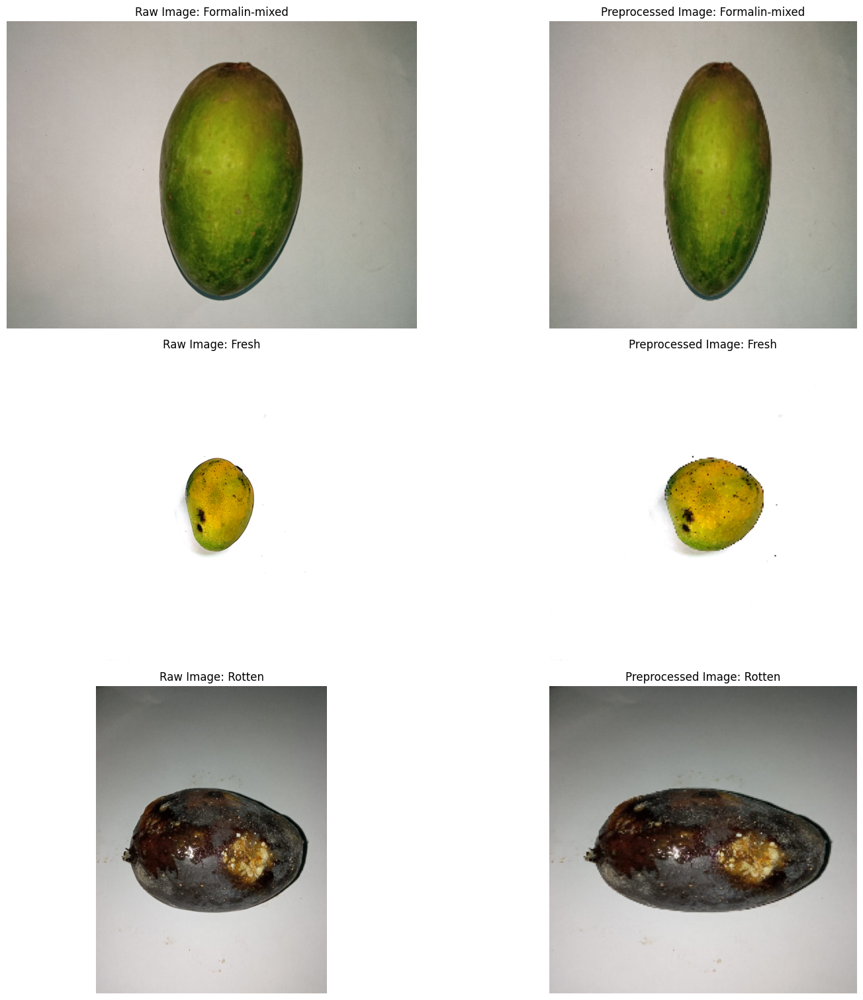

Left: Original images. Right: Resized (224x224) and normalized (0-1).


In [ ]:
# Visualize raw and preprocessed images
if not any(sample_images.values()):  # Check if all values are None
    raise ValueError("No sample images were loaded. Check previous output for errors.")

plt.figure(figsize=(15, 5 * len(class_labels)))
for i, (label, img_pair) in enumerate(sample_images.items(), 1):
    if img_pair is None:
        print(f"No sample image for {label}. Skipping visualization.")
        continue
    raw_img, preproc_img = img_pair
    # Raw image
    plt.subplot(len(class_labels), 2, 2 * i - 1)
    plt.imshow(raw_img)
    plt.title(f"Raw Image: {label}")
    plt.axis('off')

    # Preprocessed image
    plt.subplot(len(class_labels), 2, 2 * i)
    plt.imshow(preproc_img)
    plt.title(f"Preprocessed Image: {label}")
    plt.axis('off')

plt.tight_layout()
plt.show()

print("Left: Original images. Right: Resized (224x224) and normalized (0-1).")

# Visualizing Class Distribution

Text(0, 0.5, 'Count')

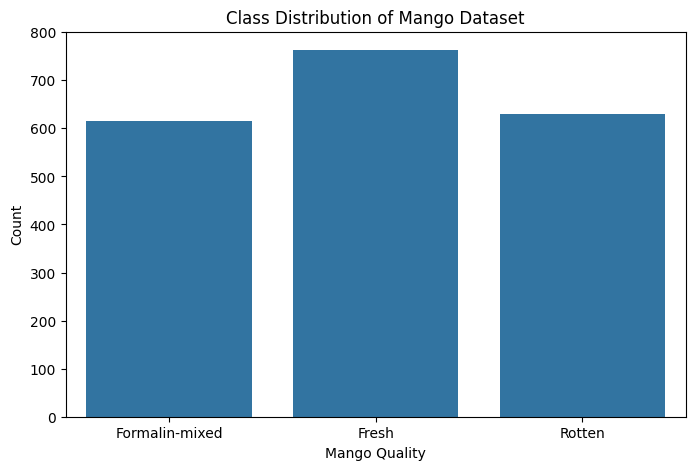

In [ ]:
# Visualizing Class Distribution
plt.figure(figsize=(8,5))
sns.countplot(x=y, order=np.unique(y))
plt.title("Class Distribution of Mango Dataset")
plt.xlabel("Mango Quality")
plt.ylabel("Count")

# Preprocess Data

In [ ]:
# Preprocess data
le = LabelEncoder()
y_encoded = le.fit_transform(y)

X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_train_cp = cp.array(X_train_scaled)
X_test_cp = cp.array(X_test_scaled)
y_train_cp = cp.array(y_train)
y_test_cp = cp.array(y_test)

X_train_np = X_train_scaled
X_test_np = X_test_scaled
y_train_np = y_train
y_test_np = y_test

print("Data preprocessed and split!")

Data preprocessed and split!


# Train Models

In [ ]:
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, StackingClassifier, VotingClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score
import numpy as np

models = {}
predictions = {}

# Random Forest (CPU, scikit-learn)
rf = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
rf.fit(X_train_np, y_train_np)
y_pred_rf = rf.predict(X_test_np)
models['RandomForest'] = rf
predictions['RandomForest'] = y_pred_rf
print(f"Random Forest Accuracy: {accuracy_score(y_test_np, y_pred_rf):.4f}")

# SVM (CPU, scikit-learn)
svm = SVC(kernel="linear", probability=True, random_state=42)
svm.fit(X_train_np, y_train_np)
y_pred_svm = svm.predict(X_test_np)
models['SVM'] = svm
predictions['SVM'] = y_pred_svm
print(f"SVM Accuracy: {accuracy_score(y_test_np, y_pred_svm):.4f}")

# Decision Tree (CPU, scikit-learn)
dt = DecisionTreeClassifier(random_state=42)
dt.fit(X_train_np, y_train_np)
y_pred_dt = dt.predict(X_test_np)
models['DecisionTree'] = dt
predictions['DecisionTree'] = y_pred_dt
print(f"Decision Tree Accuracy: {accuracy_score(y_test_np, y_pred_dt):.4f}")

# MLP (CPU, scikit-learn)
mlp = MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42)
mlp.fit(X_train_np, y_train_np)
y_pred_mlp = mlp.predict(X_test_np)
models['MLP'] = mlp
predictions['MLP'] = y_pred_mlp
print(f"MLP Accuracy: {accuracy_score(y_test_np, y_pred_mlp):.4f}")

# AdaBoost (CPU, scikit-learn)
ada = AdaBoostClassifier(n_estimators=100, random_state=42)
ada.fit(X_train_np, y_train_np)
y_pred_ada = ada.predict(X_test_np)
models['AdaBoost'] = ada
predictions['AdaBoost'] = y_pred_ada
print(f"AdaBoost Accuracy: {accuracy_score(y_test_np, y_pred_ada):.4f}")

# XGBoost (GPU, xgboost library)
xgb = XGBClassifier(n_estimators=100, random_state=42, device='cuda')
xgb.fit(X_train_np, y_train_np)
y_pred_xgb = xgb.predict(X_test_np)
models['XGBoost'] = xgb
predictions['XGBoost'] = y_pred_xgb
print(f"XGBoost Accuracy: {accuracy_score(y_test_np, y_pred_xgb):.4f}")

# Naive Bayes (CPU, scikit-learn GaussianNB)
nb = GaussianNB()
nb.fit(X_train_np, y_train_np)
y_pred_nb = nb.predict(X_test_np)
models['NaiveBayes'] = nb
predictions['NaiveBayes'] = y_pred_nb
print(f"Naive Bayes Accuracy: {accuracy_score(y_test_np, y_pred_nb):.4f}")

# KNN (CPU, scikit-learn)
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train_np, y_train_np)
y_pred_knn = knn.predict(X_test_np)
models['KNN'] = knn
predictions['KNN'] = y_pred_knn
print(f"KNN Accuracy: {accuracy_score(y_test_np, y_pred_knn):.4f}")

# Stacking Classifier (CPU, scikit-learn)
base_models = [
    ('rf', RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)),
    ('svm', SVC(kernel="linear", probability=True, random_state=42)),
    ('dt', DecisionTreeClassifier(random_state=42)),
    ('mlp', MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42)),
    ('ada', AdaBoostClassifier(n_estimators=100, random_state=42)),
    ('xgb', XGBClassifier(n_estimators=100, random_state=42, device='cuda')),
    ('nb', GaussianNB()),
    ('knn', KNeighborsClassifier(n_neighbors=5))
]
stacking_clf = StackingClassifier(
    estimators=base_models,
    final_estimator=LogisticRegression(),
    cv=5,
    n_jobs=-1
)
stacking_clf.fit(X_train_np, y_train_np)
y_pred_stack = stacking_clf.predict(X_test_np)
models['Stacking'] = stacking_clf
predictions['Stacking'] = y_pred_stack
print(f"Stacking Classifier Accuracy: {accuracy_score(y_test_np, y_pred_stack):.4f}")

# Voting Classifier (CPU, scikit-learn, soft voting)
voting_clf = VotingClassifier(
    estimators=[
        ('rf', RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)),
        ('svm', SVC(kernel="linear", probability=True, random_state=42)),
        ('mlp', MLPClassifier(hidden_layer_sizes=(100,), max_iter=500, random_state=42)),
        ('ada', AdaBoostClassifier(n_estimators=100, random_state=42)),
        ('xgb', XGBClassifier(n_estimators=100, random_state=42, device='cuda')),
        ('nb', GaussianNB()),
        ('knn', KNeighborsClassifier(n_neighbors=5))
    ],
    voting='soft',
    n_jobs=-1
)
voting_clf.fit(X_train_np, y_train_np)
y_pred_vote = voting_clf.predict(X_test_np)
models['Voting'] = voting_clf
predictions['Voting'] = y_pred_vote
print(f"Voting Classifier Accuracy: {accuracy_score(y_test_np, y_pred_vote):.4f}")

Random Forest Accuracy: 0.9378
SVM Accuracy: 0.9353
Decision Tree Accuracy: 0.8905
MLP Accuracy: 0.9478
AdaBoost Accuracy: 0.9030
XGBoost Accuracy: 0.9428
Naive Bayes Accuracy: 0.8134
KNN Accuracy: 0.9204


/usr/local/lib/python3.11/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Stacking Classifier Accuracy: 0.9527
Voting Classifier Accuracy: 0.9478


# Confusion Matrix and Evaluation Metrics for All Models

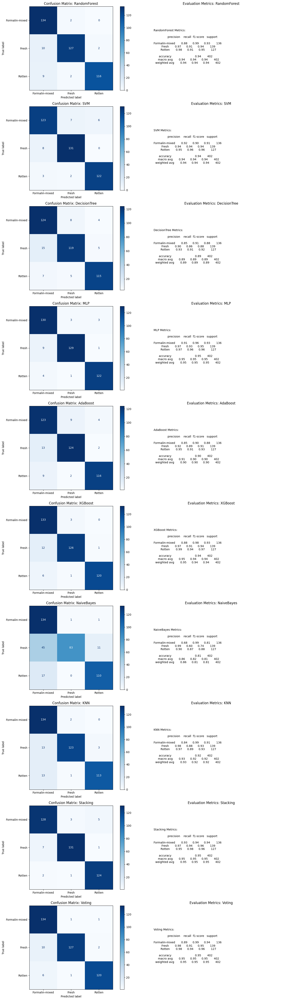

Explanation:
- Confusion Matrix (Left): Shows True vs. Predicted labels. Diagonal = correct predictions.
  - Rows: Actual classes, Columns: Predicted classes.
- Metrics (Right):
  - Precision: How many predicted positives were correct.
  - Recall: How many actual positives were caught.
  - F1-Score: Balance of precision and recall.
  - Accuracy: Overall correctness.
  - Support: Number of samples per class.


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay
import numpy as np
import matplotlib.pyplot as plt

# Ensure true labels are NumPy arrays
y_test_np = np.asarray(y_test_np)

# Get unique classes in test set and map back to original labels
unique_test_labels = np.unique(y_test_np)
test_class_labels = [class_labels[label] for label in unique_test_labels]  # Map encoded labels to names

# Plot confusion matrices and print evaluation metrics
plt.figure(figsize=(15, 5 * len(models)))

for i, (name, model) in enumerate(models.items(), 1):
    # Get predictions (convert CuPy to NumPy if needed)
    y_pred = predictions[name]
    if isinstance(y_pred, cp.ndarray):
        y_pred = cp.asnumpy(y_pred)

    # Confusion Matrix
    cm = confusion_matrix(y_test_np, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=test_class_labels)

    plt.subplot(len(models), 2, 2 * i - 1)
    disp.plot(ax=plt.gca(), cmap='Blues')
    plt.title(f"Confusion Matrix: {name}")

    # Evaluation Metrics
    report = classification_report(y_test_np, y_pred, target_names=test_class_labels, output_dict=False)
    plt.subplot(len(models), 2, 2 * i)
    plt.text(0.1, 0.5, f"{name} Metrics:\n\n{report}", fontsize=10, va='center')
    plt.title(f"Evaluation Metrics: {name}")
    plt.axis('off')

plt.tight_layout()
plt.show()

print("Explanation:")
print("- Confusion Matrix (Left): Shows True vs. Predicted labels. Diagonal = correct predictions.")
print("  - Rows: Actual classes, Columns: Predicted classes.")
print("- Metrics (Right):")
print("  - Precision: How many predicted positives were correct.")
print("  - Recall: How many actual positives were caught.")
print("  - F1-Score: Balance of precision and recall.")
print("  - Accuracy: Overall correctness.")
print("  - Support: Number of samples per class.")

# Save models

In [ ]:
# Save models using pickle for consistency
save_dir = "/content/drive/MyDrive/Fruits Original/Models"
os.makedirs(save_dir, exist_ok=True)

for name, model in models.items():
    file_path = os.path.join(save_dir, f"{name}.pkl")
    with open(file_path, 'wb') as f:
        pickle.dump(model, f)
    print(f"Saved {name} model to {file_path}")

print("All models saved successfully using pickle!")

Saved RandomForest model to /content/drive/MyDrive/Fruits Original/Models/RandomForest.pkl
Saved SVM model to /content/drive/MyDrive/Fruits Original/Models/SVM.pkl
Saved DecisionTree model to /content/drive/MyDrive/Fruits Original/Models/DecisionTree.pkl
Saved MLP model to /content/drive/MyDrive/Fruits Original/Models/MLP.pkl
Saved AdaBoost model to /content/drive/MyDrive/Fruits Original/Models/AdaBoost.pkl
Saved XGBoost model to /content/drive/MyDrive/Fruits Original/Models/XGBoost.pkl
Saved NaiveBayes model to /content/drive/MyDrive/Fruits Original/Models/NaiveBayes.pkl
Saved KNN model to /content/drive/MyDrive/Fruits Original/Models/KNN.pkl
Saved Stacking model to /content/drive/MyDrive/Fruits Original/Models/Stacking.pkl
Saved Voting model to /content/drive/MyDrive/Fruits Original/Models/Voting.pkl
All models saved successfully using pickle!


# Visualize Feature Extraction Process

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step


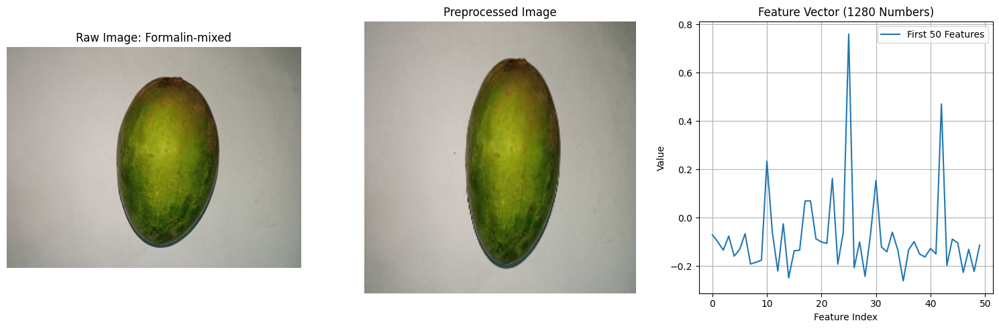

Explanation:
- Raw Image: What the camera sees.
- Preprocessed Image: Shrunk and adjusted for the AI.
- Features: 1280 numbers from EfficientNetB0. Each number is like a 'clue' (e.g., edge strength, color) the AI uses to decide 'Rotten' or 'Fresh'.
What AI Does: It learns patterns in these numbers to classify images!


In [ ]:
# Pick one valid sample image to explain feature extraction
valid_subfolders = [label for label in sample_images.keys() if not label.startswith('.') and os.path.isdir(os.path.join(image_folder, label))]
if not valid_subfolders:
    raise ValueError(f"No valid subfolders with images found in {image_folder}. Check the dataset structure.")

sample_label = valid_subfolders[0]  # Pick the first valid subfolder (e.g., 'Fresh', 'Formalin-mixed', 'Rotten')
sample_dir = os.path.join(image_folder, sample_label)
image_files = [f for f in os.listdir(sample_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

if not image_files:
    raise ValueError(f"No valid image files found in {sample_dir}. Check the dataset directory.")

sample_image_path = os.path.join(sample_dir, image_files[0])

# Check if sample image exists in sample_images
if sample_images[sample_label] is None:
    # If None, extract features directly from the file
    sample_features, sample_raw_img, sample_preproc_img = extract_features(sample_image_path, base_model, visualize=True)
    print(f"No pre-loaded sample for {sample_label}. Extracted from {sample_image_path}.")
else:
    sample_raw_img, sample_preproc_img = sample_images[sample_label]
    sample_features = extract_features(sample_image_path, base_model, visualize=False)

# Plot raw image, preprocessed image, and feature vector
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(sample_raw_img)
plt.title(f"Raw Image: {sample_label}")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(sample_preproc_img)
plt.title("Preprocessed Image")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.plot(sample_features[:50], label="First 50 Features")
plt.title("Feature Vector (1280 Numbers)")
plt.xlabel("Feature Index")
plt.ylabel("Value")
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

print("Explanation:")
print("- Raw Image: What the camera sees.")
print("- Preprocessed Image: Shrunk and adjusted for the AI.")
print("- Features: 1280 numbers from EfficientNetB0. Each number is like a 'clue' (e.g., edge strength, color) the AI uses to decide 'Rotten' or 'Fresh'.")
print("What AI Does: It learns patterns in these numbers to classify images!")

# 2D t-SNE Visualisation of features

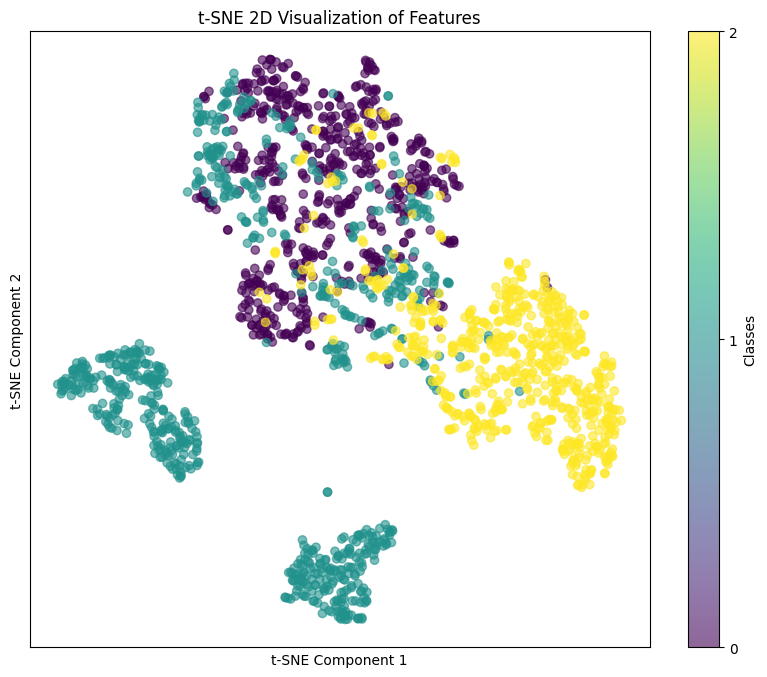

2D t-SNE: Clusters show feature similarity by class!


In [ ]:
tsne_2d = TSNE(n_components=2, random_state=42, perplexity=30)
X_tsne_2d = tsne_2d.fit_transform(X)

plt.figure(figsize=(10, 8))
scatter = plt.scatter(X_tsne_2d[:, 0], X_tsne_2d[:, 1], c=y_encoded, cmap='viridis', alpha=0.6)
plt.colorbar(scatter, ticks=range(len(class_labels)), label='Classes')
plt.title("t-SNE 2D Visualization of Features")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.xticks([])
plt.yticks([])
plt.show()

print("2D t-SNE: Clusters show feature similarity by class!")

# 3D t-SNE Visualisation of features

In [ ]:
tsne_3d = TSNE(n_components=3, random_state=42, perplexity=30)
X_tsne_3d = tsne_3d.fit_transform(X)

fig = px.scatter_3d(
    x=X_tsne_3d[:, 0], y=X_tsne_3d[:, 1], z=X_tsne_3d[:, 2],
    color=y,
    labels={'x': 'Component 1', 'y': 'Component 2', 'z': 'Component 3'},
    title="t-SNE 3D Visualization of Features",
    opacity=0.7
)
fig.update_layout(width=800, height=600)
fig.show()

print("3D t-SNE: Rotate to explore clusters!")

3D t-SNE: Rotate to explore clusters!


# Visualize Feature Extraction Process

21834768/21834768 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_478']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


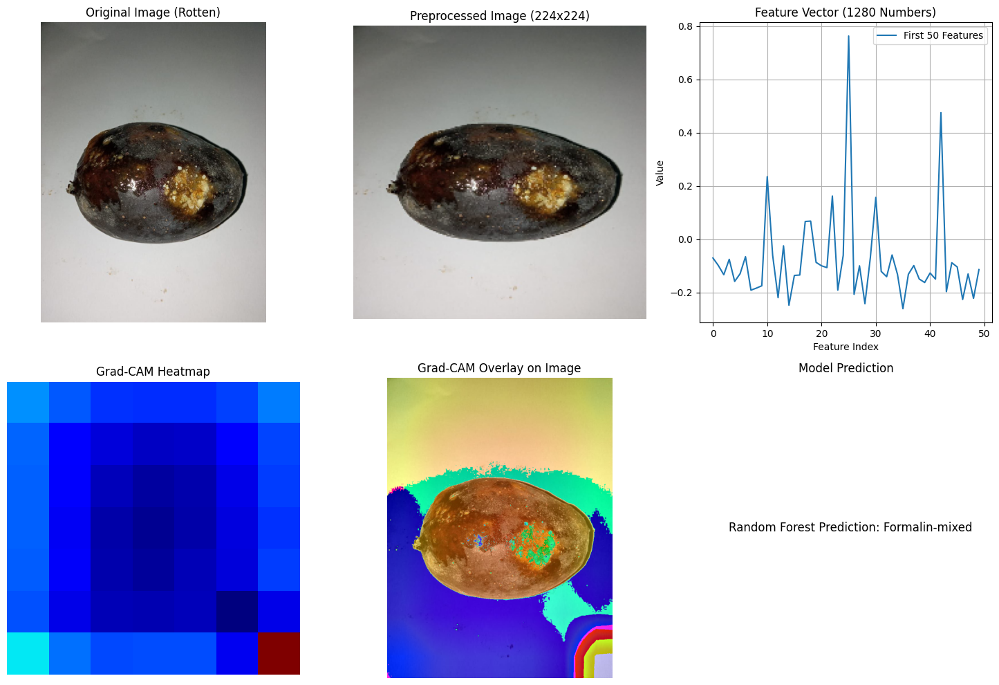

Explanation:
- Original Image: The raw photo of a mango.
- Preprocessed Image: Resized and normalized for the AI.
- Feature Vector: 1280 numbers from EfficientNetB0, summarizing the image (e.g., edges, colors).
- Grad-CAM Heatmap: Shows where the AI looks (red = important areas) to make its decision.
- Overlay: Combines heatmap with the image to highlight key regions (e.g., rotten spots).
- Prediction: How Random Forest uses these features to classify (ties to confusion matrix).


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Function to preprocess image for EfficientNetB0
def preprocess_image(image_path):
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_resized = cv2.resize(image, (224, 224))
    image_normalized = image_resized.astype("float32") / 255.0
    return image, image_resized, np.expand_dims(image_normalized, axis=0)

# Grad-CAM implementation
def get_gradcam_heatmap(model, img_array, layer_name='top_conv'):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        class_idx = tf.argmax(predictions[0])
        loss = predictions[:, class_idx]

    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_mean(conv_outputs * pooled_grads, axis=-1)
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap) + 1e-10  # Normalize
    return heatmap

# Overlay heatmap on original image
def overlay_heatmap(heatmap, original_image):
    heatmap = cv2.resize(heatmap, (original_image.shape[1], original_image.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = heatmap * 0.4 + original_image
    return superimposed_img

# Pick a sample image (e.g., from Rotten)
sample_label = 'Rotten'
sample_dir = os.path.join(image_folder, sample_label)
sample_image_path = os.path.join(sample_dir, os.listdir(sample_dir)[0])

# Load and preprocess the image
original_img, resized_img, img_array = preprocess_image(sample_image_path)

# Load EfficientNetB0 with full output (for Grad-CAM)
effnet_model = EfficientNetB0(weights="imagenet", include_top=True)  # Full model for classification
base_model = EfficientNetB0(weights="imagenet", include_top=False, pooling="avg")  # Feature extractor

# Extract features
features = base_model.predict(img_array)

# Get Grad-CAM heatmap
heatmap = get_gradcam_heatmap(effnet_model, img_array)
superimposed_img = overlay_heatmap(heatmap, original_img)

# Plotting
plt.figure(figsize=(15, 10))

# Original Image
plt.subplot(2, 3, 1)
plt.imshow(original_img)
plt.title("Original Image (Rotten)")
plt.axis('off')

# Preprocessed Image
plt.subplot(2, 3, 2)
plt.imshow(resized_img)
plt.title("Preprocessed Image (224x224)")
plt.axis('off')

# Feature Vector (first 50 features)
plt.subplot(2, 3, 3)
plt.plot(features[0][:50], label="First 50 Features")
plt.title("Feature Vector (1280 Numbers)")
plt.xlabel("Feature Index")
plt.ylabel("Value")
plt.legend()
plt.grid(True)

# Grad-CAM Heatmap
plt.subplot(2, 3, 4)
plt.imshow(heatmap, cmap='jet')
plt.title("Grad-CAM Heatmap")
plt.axis('off')

# Superimposed Image
plt.subplot(2, 3, 5)
plt.imshow(superimposed_img.astype('uint8'))
plt.title("Grad-CAM Overlay on Image")
plt.axis('off')

# Random Forest Prediction (example)
rf_model = models['RandomForest']
rf_pred = rf_model.predict(cp.array(features))
rf_label = class_labels[cp.asnumpy(rf_pred)[0]]
plt.subplot(2, 3, 6)
plt.text(0.1, 0.5, f"Random Forest Prediction: {rf_label}", fontsize=12, va='center')
plt.title("Model Prediction")
plt.axis('off')

plt.tight_layout()
plt.show()

print("Explanation:")
print("- Original Image: The raw photo of a mango.")
print("- Preprocessed Image: Resized and normalized for the AI.")
print("- Feature Vector: 1280 numbers from EfficientNetB0, summarizing the image (e.g., edges, colors).")
print("- Grad-CAM Heatmap: Shows where the AI looks (red = important areas) to make its decision.")
print("- Overlay: Combines heatmap with the image to highlight key regions (e.g., rotten spots).")
print("- Prediction: How Random Forest uses these features to classify (ties to confusion matrix).")

# Sample Test with Test Images, Majority Voting, Stacking, and Voting

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
Processing RandomForest: Model type = <class 'sklearn.ensemble._forest.RandomForestClassifier'>
Processing SVM: Model type = <class 'sklearn.svm._classes.SVC'>
Processing DecisionTree: Model type = <class 'sklearn.tree._classes.DecisionTreeClassifier'>
Processing MLP: Model type = <class 'sklearn.neural_network._multilayer_perceptron.MLPClassifier'>
Processing AdaBoost: Model type = <class 'sklearn.ensemble._weight_boosting.AdaBoostClassifier'>
Processing XGBoost: Model type = <class 'xgboost.sklearn.XGBClassifier'>
Processing NaiveBayes: Model type = <class 'sklearn.naive_bayes.GaussianNB'>
Processing KNN: Model type = <class 'sklearn.neighbors._classification.KNeighborsClassifier'>
Processing Stacking: Model type = <class 'sklearn.ensemble._stacking.StackingClassifier'>
Processing Voting: Model type = <class 'sklearn.ensemble._voting.VotingClassifier'>
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
Processing RandomForest: Model type = <class 'sklearn.ensem

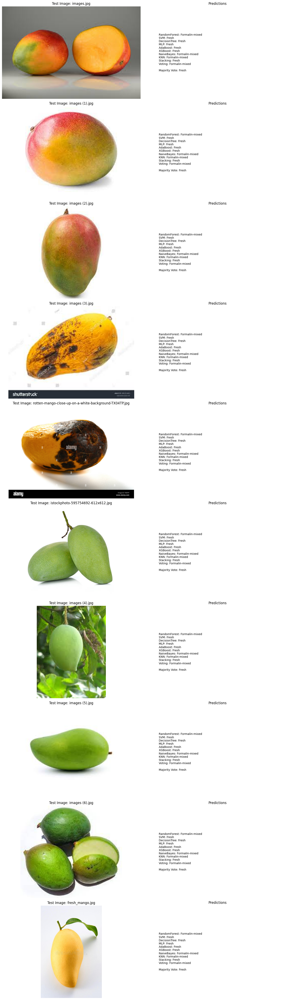

Explanation:
- Left: Test image from the folder.
- Right: Predictions from each model (all scikit-learn except XGBoost), including Stacking and Voting, plus majority vote.
  - Models use the same 1280 features from EfficientNetB0 as in training.
  - Stacking: Uses a meta-model (Logistic Regression) to combine base model predictions.
  - Voting: Averages probabilities (soft voting) from base models.
  - Majority Vote: Most common prediction across all models.


In [ ]:
import os
import cv2
import numpy as np
from scipy.stats import mode
import matplotlib.pyplot as plt
from tensorflow.keras.applications import EfficientNetB0

# Function to preprocess and extract features from a test image
def process_test_image(image_path, feature_model):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Error loading image: {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_resized = cv2.resize(image, (224, 224))
    image_normalized = image_resized.astype("float32") / 255.0
    img_array = np.expand_dims(image_normalized, axis=0)
    features = feature_model.predict(img_array)
    return image, features.flatten()

# Test folder
test_folder = "/content/drive/MyDrive/Fruit Quality Assessment/Test Images"
test_images = [f for f in os.listdir(test_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

if not test_images:
    raise ValueError(f"No valid test images found in {test_folder}")

# Load feature extraction model (same as training)
base_model = EfficientNetB0(weights="imagenet", include_top=False, pooling="avg")

# Process and predict for all test images
plt.figure(figsize=(15, 5 * len(test_images)))
for i, test_image in enumerate(test_images, 1):
    image_path = os.path.join(test_folder, test_image)

    # Extract features
    original_img, features = process_test_image(image_path, base_model)

    # Predictions from all models (all use NumPy)
    predictions_dict = {}
    numeric_preds = []
    for name, model in models.items():
        print(f"Processing {name}: Model type = {type(model)}")
        pred = model.predict(np.asarray(features.reshape(1, -1)))
        pred_idx = pred[0]
        pred_label = class_labels[pred_idx]
        predictions_dict[name] = pred_label
        numeric_preds.append(pred_idx)

    # Majority Voting on numeric predictions
    majority_vote, _ = mode(numeric_preds)
    majority_vote_idx = majority_vote.item() if np.isscalar(majority_vote) else majority_vote[0]
    majority_vote_label = class_labels[majority_vote_idx]

    # Plot image and predictions
    plt.subplot(len(test_images), 2, 2 * i - 1)
    plt.imshow(original_img)
    plt.title(f"Test Image: {test_image}")
    plt.axis('off')

    plt.subplot(len(test_images), 2, 2 * i)
    pred_text = "\n".join([f"{name}: {pred}" for name, pred in predictions_dict.items()])
    pred_text += f"\n\nMajority Vote: {majority_vote_label}"
    plt.text(0.1, 0.5, pred_text, fontsize=10, va='center')
    plt.title("Predictions")
    plt.axis('off')

plt.tight_layout()
plt.show()

print("Explanation:")
print("- Left: Test image from the folder.")
print("- Right: Predictions from each model (all scikit-learn except XGBoost), including Stacking and Voting, plus majority vote.")
print("  - Models use the same 1280 features from EfficientNetB0 as in training.")
print("  - Stacking: Uses a meta-model (Logistic Regression) to combine base model predictions.")
print("  - Voting: Averages probabilities (soft voting) from base models.")
print("  - Majority Vote: Most common prediction across all models.")

# Train an Optimized CNN Model for Best Accuracy

Found 1608 images belonging to 3 classes.
Found 401 images belonging to 3 classes.
Class indices: {'Rotten': 0, 'Fresh': 1, 'Formalin-mixed': 2}
Class weights: {np.int32(0): 1.0634920634920635, np.int32(1): 0.8772504091653028, np.int32(2): 1.0872210953346857}
16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Training with frozen base layers...


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/15
51/51 ━━━━━━━━━━━━━━━━━━━━ 578s 11s/step - accuracy: 0.3216 - loss: 1.3920 - val_accuracy: 0.3142 - val_loss: 1.2485 - learning_rate: 0.0010
Epoch 2/15
51/51 ━━━━━━━━━━━━━━━━━━━━ 49s 967ms/step - accuracy: 0.3398 - loss: 1.2252 - val_accuracy: 0.3067 - val_loss: 1.1343 - learning_rate: 0.0010
Epoch 3/15
51/51 ━━━━━━━━━━━━━━━━━━━━ 83s 983ms/step - accuracy: 0.3247 - loss: 1.2044 - val_accuracy: 0.3142 - val_loss: 1.1070 - learning_rate: 0.0010
Epoch 4/15
51/51 ━━━━━━━━━━━━━━━━━━━━ 50s 986ms/step - accuracy: 0.3394 - loss: 1.2153 - val_accuracy: 0.3791 - val_loss: 1.2369 - learning_rate: 0.0010
Epoch 5/15
51/51 ━━━━━━━━━━━━━━━━━━━━ 55s 1s/step - accuracy: 0.3486 - loss: 1.1990 - val_accuracy: 0.3791 - val_loss: 1.1261 - learning_rate: 0.0010
Epoch 6/15
51/51 ━━━━━━━━━━━━━━━━━━━━ 50s 985ms/step - accuracy: 0.3673 - loss: 1.1354 - val_accuracy: 0.3142 - val_loss: 1.2228 - learning_rate: 0.0010
Epoch 7/15
51/51 ━━━━━━━━━━━━━━━━━━━━ 54s 1s/step - accuracy: 0.3443 - loss: 1.1481 - 

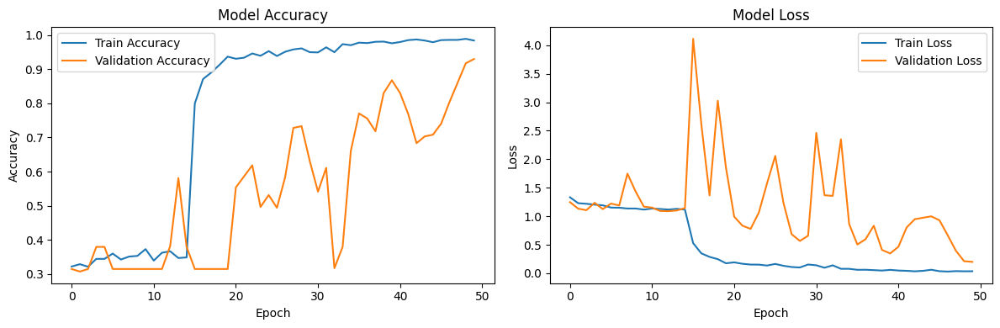

CNN model saved to /content/drive/MyDrive/mango_cnn_model.keras
Explanation:
- Optimized CNN uses EfficientNetB0, fine-tuned on raw mango images.
- Enhanced augmentation, batch normalization, and class weights improve performance.
- Two-phase training with early stopping (patience=10) and learning rate reduction.
- Goal: Beat Stacking Classifier's accuracy of 0.9527. Achieved: 0.9302


In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
from collections import Counter

# Set random seed for reproducibility
tf.random.set_seed(42)
np.random.seed(42)

# Data parameters
image_folder = "/content/drive/MyDrive/Fruits Original/Mango"
img_size = (224, 224)
batch_size = 32
num_classes = 3

# Enhanced data augmentation for training
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.4,
    height_shift_range=0.4,
    shear_range=0.4,
    zoom_range=0.4,
    horizontal_flip=True,
    vertical_flip=True,
    brightness_range=[0.7, 1.3],
    validation_split=0.2
)

# No augmentation for validation (stable evaluation)
val_datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2
)

# Filter out hidden folders
valid_classes = [d for d in os.listdir(image_folder) if os.path.isdir(os.path.join(image_folder, d)) and not d.startswith('.')]

# Load training data
train_generator = train_datagen.flow_from_directory(
    image_folder,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='training',
    shuffle=True,
    classes=valid_classes
)

# Load validation data (no augmentation)
validation_generator = val_datagen.flow_from_directory(
    image_folder,
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    subset='validation',
    shuffle=False,
    classes=valid_classes
)

print("Class indices:", train_generator.class_indices)

# Compute class weights
class_counts = Counter(train_generator.classes)
total_samples = sum(class_counts.values())
class_weights = {cls: total_samples / (num_classes * count) for cls, count in class_counts.items()}
print("Class weights:", class_weights)

# Define CNN with transfer learning
base_model = EfficientNetB0(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

inputs = Input(shape=(224, 224, 3))
x = base_model(inputs, training=False)
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = BatchNormalization()(x)  # Added for regularization
x = Dropout(0.4)(x)  # Adjusted dropout
outputs = Dense(num_classes, activation='softmax')(x)
cnn_model = Model(inputs, outputs)

# Compile the model
cnn_model.compile(optimizer=Adam(learning_rate=0.001),
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

# Callbacks
early_stopping = EarlyStopping(monitor='val_accuracy', patience=10, restore_best_weights=True)  # Increased patience
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-6)

# Initial training with frozen base layers
print("Training with frozen base layers...")
history_phase1 = cnn_model.fit(
    train_generator,
    epochs=15,
    validation_data=validation_generator,
    class_weight=class_weights,
    callbacks=[early_stopping, reduce_lr],
    verbose=1
)

# Unfreeze more layers for fine-tuning
base_model.trainable = True
for layer in base_model.layers[:20]:  # Unfreeze from layer 20
    layer.trainable = False

# Recompile with higher initial learning rate
cnn_model.compile(optimizer=Adam(learning_rate=0.0005),  # Increased from 0.0001
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

# Fine-tuning
print("Fine-tuning with unfrozen layers...")
history_phase2 = cnn_model.fit(
    train_generator,
    epochs=50,  # Increased max epochs
    validation_data=validation_generator,
    initial_epoch=history_phase1.epoch[-1] + 1,
    class_weight=class_weights,
    callbacks=[early_stopping, reduce_lr],
    verbose=1
)

# Evaluate on validation set
val_loss, val_accuracy = cnn_model.evaluate(validation_generator)
print(f"Validation Accuracy: {val_accuracy:.4f}")

# Plot training history
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history_phase1.history['accuracy'] + history_phase2.history['accuracy'], label='Train Accuracy')
plt.plot(history_phase1.history['val_accuracy'] + history_phase2.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history_phase1.history['loss'] + history_phase2.history['loss'], label='Train Loss')
plt.plot(history_phase1.history['val_loss'] + history_phase2.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# Save the model
cnn_model.save("/content/drive/MyDrive/mango_cnn_model.keras")
print("CNN model saved to /content/drive/MyDrive/mango_cnn_model.keras")

print("Explanation:")
print("- Optimized CNN uses EfficientNetB0, fine-tuned on raw mango images.")
print("- Enhanced augmentation, batch normalization, and class weights improve performance.")
print("- Two-phase training with early stopping (patience=10) and learning rate reduction.")
print(f"- Goal: Beat Stacking Classifier's accuracy of 0.9527. Achieved: {val_accuracy:.4f}")

# Test CNN Model on Test Images

CNN model loaded from /content/drive/MyDrive/mango_cnn_model.keras
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step


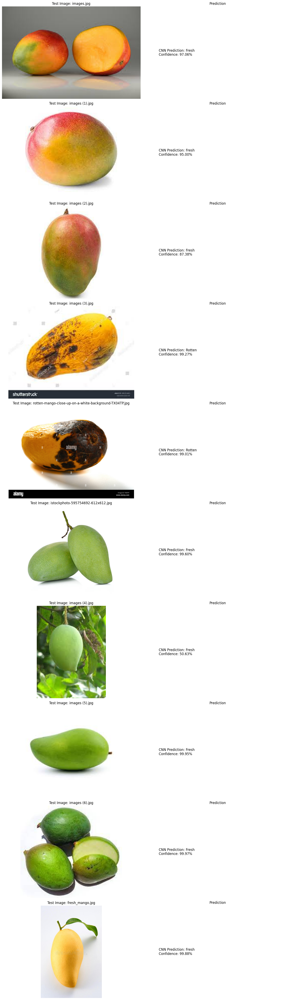

Explanation:
- Left: Test image from the folder.
- Right: CNN prediction and confidence score.
- Model loaded from /content/drive/MyDrive/mango_cnn_model.keras with validation accuracy of 0.9302.
- Images preprocessed to 224x224 and normalized (same as training).


In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

# Load the trained CNN model
model_path = "/content/drive/MyDrive/mango_cnn_model.keras"
cnn_model = tf.keras.models.load_model(model_path)
print("CNN model loaded from", model_path)

# Test folder
test_folder = "/content/drive/MyDrive/Fruit Quality Assessment/Test Images"
test_images = [f for f in os.listdir(test_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

if not test_images:
    raise ValueError(f"No valid test images found in {test_folder}")

# Class labels (matching training order)
class_labels = ['Rotten', 'Fresh', 'Formalin-mixed']  # From Class indices: {'Rotten': 0, 'Fresh': 1, 'Formalin-mixed': 2}

# Function to preprocess test image
def preprocess_test_image(image_path):
    image = cv2.imread(image_path)
    if image is None:
        raise ValueError(f"Error loading image: {image_path}")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image_resized = cv2.resize(image, (224, 224))  # Match training input size
    image_normalized = image_resized.astype("float32") / 255.0
    img_array = np.expand_dims(image_normalized, axis=0)  # Add batch dimension
    return image, img_array

# Process and predict for all test images
plt.figure(figsize=(15, 5 * len(test_images)))
for i, test_image in enumerate(test_images, 1):
    image_path = os.path.join(test_folder, test_image)

    # Preprocess image
    original_img, img_array = preprocess_test_image(image_path)

    # Predict with CNN
    pred_probs = cnn_model.predict(img_array)
    pred_idx = np.argmax(pred_probs, axis=1)[0]
    pred_label = class_labels[pred_idx]
    pred_confidence = pred_probs[0][pred_idx] * 100  # Confidence in percentage

    # Plot image and prediction
    plt.subplot(len(test_images), 2, 2 * i - 1)
    plt.imshow(original_img)
    plt.title(f"Test Image: {test_image}")
    plt.axis('off')

    plt.subplot(len(test_images), 2, 2 * i)
    pred_text = f"CNN Prediction: {pred_label}\nConfidence: {pred_confidence:.2f}%"
    plt.text(0.1, 0.5, pred_text, fontsize=12, va='center')
    plt.title("Prediction")
    plt.axis('off')

plt.tight_layout()
plt.show()

print("Explanation:")
print("- Left: Test image from the folder.")
print("- Right: CNN prediction and confidence score.")
print(f"- Model loaded from {model_path} with validation accuracy of 0.9302.")
print("- Images preprocessed to 224x224 and normalized (same as training).")